In [1]:
import xarray as xr
from dask.distributed import Client
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import datetime as dt

In [2]:
client = Client()
client

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.06/lib/python3.11/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 42213 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/42213/status,
Dashboard: /proxy/42213/status,Workers: 7
Total threads: 14,Total memory: 63.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42899,Workers: 0
Dashboard: /proxy/42213/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:43429,Total threads: 2
Dashboard: /proxy/36107/status,Memory: 9.00 GiB
Nanny: tcp://127.0.0.1:45383,


In [3]:
fdaily_aest = xr.open_dataset(
    "/g/data/ng72/ab4502/sea_breeze_detection/barra_c_smooth_s2/filters/daily_filtered_standard_F_aest_19790101_20241231.zarr/",
    engine="zarr",chunks={}).mask.sel(time=slice("1979-01-01","2024-12-31 23:00"))
fdaily_awst = xr.open_dataset(
    "/g/data/ng72/ab4502/sea_breeze_detection/barra_c_smooth_s2/filters/daily_filtered_standard_F_awst_19790101_20241231.zarr/",
    engine="zarr",chunks={}).mask.sel(time=slice("1979-01-01","2024-12-31 23:00"))


In [4]:
orog = xr.open_dataset("/g/data/ob53/BARRA2/output/reanalysis/AUST-04/BOM/ERA5/historical/hres/BARRA-C2/v1/fx/orog/latest/orog_AUST-04_ERA5_historical_hres_BOM_BARRA-C2_v1.nc")


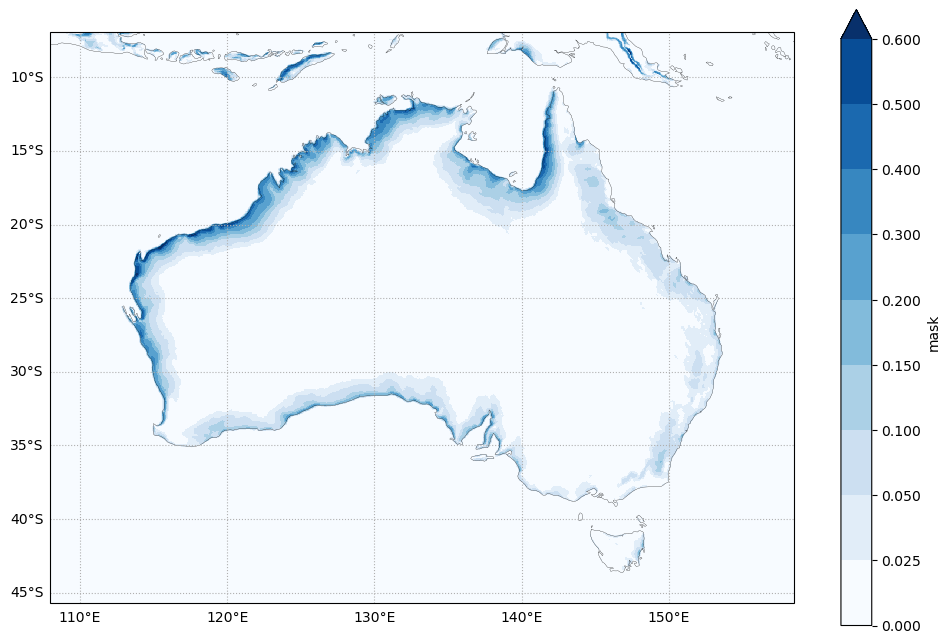

In [5]:
levels = [0,0.025,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6]

plt.figure(figsize=[12,8])

ax=plt.axes(projection=ccrs.PlateCarree())
fdaily_aest.mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])

In [6]:
shapes = xr.open_dataset("/g/data/ng72/ab4502/coastline_data/rez_coastal_shapes.nc")
rez_mask = xr.open_dataset("/g/data/ng72/ri9247/data/masks/rez_mask_AUST-04.nc").rez_mask

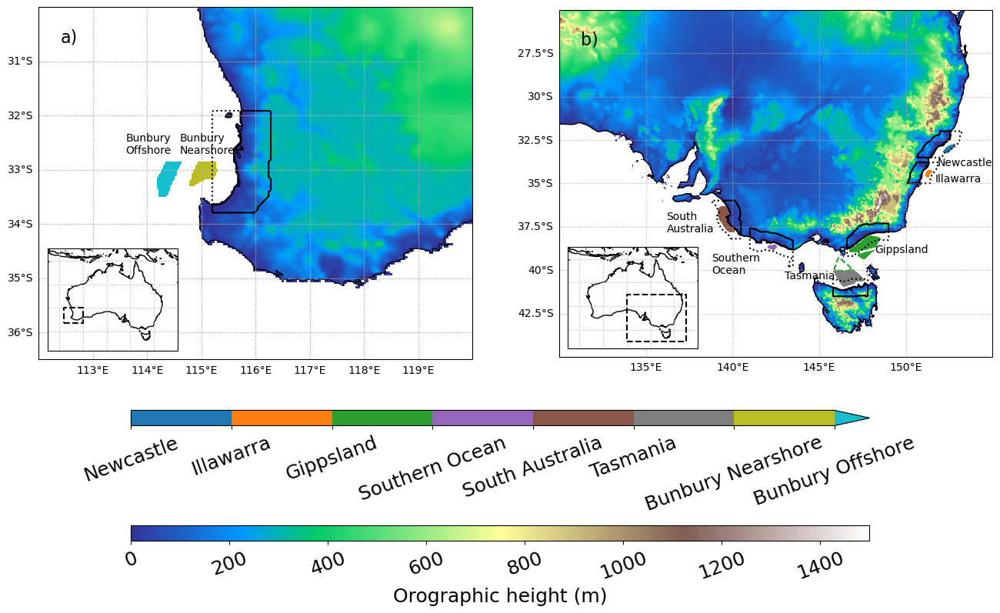

In [7]:
plt.figure(figsize=[16,10])

levels=np.array([19,18,27,28,38,42,43,44])-1

ax=plt.subplot(1,2,1,projection=ccrs.PlateCarree())

xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0),
    levels=1,colors=["k"])

xr.plot.contour(
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
    levels=1,colors=["k"],linestyles=[":"])


xr.where(shapes["lsm"],orog.sel(lat=shapes.lat,lon=shapes.lon).orog,np.nan).plot(vmin=0,vmax=1500,cmap="terrain",extend="max",add_colorbar=False)

c=xr.plot.contourf(
    xr.where(shapes["rez_mask"].isin([27,19,18,28,38,42,43,44]),shapes["rez_mask"],np.nan),add_colorbar=False,cmap="tab10",levels=levels)

ax.set_ylim([-36.5,-30])
ax.set_xlim([112,120])

ax.gridlines(ls=":")
ax.coastlines()
ax.gridlines(ls=":",draw_labels=["left","bottom"])

ax.text(0.05,0.9,"a)",transform=ax.transAxes,fontdict={"size":"16"})

ax2 = ax.inset_axes([0.02,0.02,0.3,0.3],projection=ccrs.PlateCarree())
ax2.set_xlim([105,160])
ax2.set_ylim([-48,-5])
ax2.coastlines()
ax2.gridlines(ls=":")
ax2.plot([112,120,120,112,112],[-36.5,-36.5,-30,-30,-36.5],color="k",ls="--")

plt.title("")

ax.text(113.6,-32.7,"Bunbury\nOffshore",size=10)
ax.text(114.6,-32.7,"Bunbury\nNearshore",size=10)

ax=plt.subplot(1,2,2,projection=ccrs.PlateCarree())

xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0),
    levels=1,colors=["k"])

xr.plot.contour(
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
    levels=1,colors=["k"],linestyles=[":"])

xx,yy=np.meshgrid(rez_mask.lon,rez_mask.lat)
xr.where((rez_mask==27) & (xx<=147) & (yy<-39), 1, 0).plot.contour(levels=[0.5],colors=["tab:green"],linestyles="--")

c=xr.plot.contourf(
    xr.where(shapes["rez_mask"].isin([27,19,18,28,38,42,43,44]),shapes["rez_mask"],np.nan),add_colorbar=False,cmap="tab10",levels=levels)

c_orog = xr.where(shapes["lsm"],orog.sel(lat=shapes.lat,lon=shapes.lon).orog,np.nan).plot(vmin=0,vmax=1500,cmap="terrain",extend="max",add_colorbar=False)
#xr.plot.contour(
#    xr.where(shapes["rez_mask"].isin([27,19,18,28,38,42,43]),1,0),
#    levels=1,colors=["tab:orange"],linewidths=[0.8])
#ax.coastlines(lw=0.5)

plt.title("")

ax.set_ylim([-45,-25])
ax.set_xlim([130,155])

cb=plt.colorbar(c,cax=plt.axes([0.2,0.18,0.6,0.02]),orientation="horizontal")
cb.ax.set_xticklabels(["Newcastle","Illawarra","Gippsland","Southern Ocean","South Australia","Tasmania","Bunbury Nearshore","Bunbury Offshore"])
cb.ax.tick_params(labelsize=18,rotation=20)


cb_orog=plt.colorbar(c_orog,cax=plt.axes([0.2,0.03,0.6,0.02]),orientation="horizontal")
cb_orog.ax.tick_params(labelsize=18,rotation=20)
cb_orog.ax.set_xlabel("Orographic height (m)",size=18)

ax.coastlines()
ax.gridlines(ls=":",draw_labels=["left","bottom"])
ax.text(0.05,0.9,"b)",transform=ax.transAxes,fontdict={"size":"16"})

ax2 = ax.inset_axes([0.02,0.02,0.3,0.3],projection=ccrs.PlateCarree())
ax2.set_xlim([105,160])
ax2.set_ylim([-48,-5])
ax2.coastlines()
ax2.gridlines(ls=":")
ax2.plot([130,155,155,130,130],[-45,-45,-25,-25,-45],color="k",ls="--")

ax.text(151.8,-34,"Newcastle",size=10)
ax.text(151.7,-34.9,"Illawarra",size=10)
ax.text(148.2,-39,"Gippsland",size=10)
ax.text(143,-40.5,"Tasmania",size=10)
ax.text(138.8,-40.2,"Southern\nOcean",size=10)
ax.text(136.2,-37.8,"South\nAustralia",size=10)


plt.savefig("/g/data/ng72/ab4502/figs/wind_energy_paper/map.jpeg",bbox_inches="tight",dpi=300)

In [9]:
num_years = len(np.unique(fdaily_aest.time.dt.year))
mean_djf_aest = (fdaily_aest.sel(time=np.in1d(fdaily_aest.time.dt.month,[1,2,12])).sum("time")/num_years).persist()
mean_mam_aest = (fdaily_aest.sel(time=np.in1d(fdaily_aest.time.dt.month,[3,4,5])).sum("time")/num_years).persist()
mean_jja_aest = (fdaily_aest.sel(time=np.in1d(fdaily_aest.time.dt.month,[6,7,8])).sum("time")/num_years).persist()
mean_son_aest = (fdaily_aest.sel(time=np.in1d(fdaily_aest.time.dt.month,[9,10,11])).sum("time")/num_years).persist()


mean_djf_awst = (fdaily_awst.sel(time=np.in1d(fdaily_awst.time.dt.month,[1,2,12])).sum("time")/num_years).persist()
mean_mam_awst = (fdaily_awst.sel(time=np.in1d(fdaily_awst.time.dt.month,[3,4,5])).sum("time")/num_years).persist()
mean_jja_awst = (fdaily_awst.sel(time=np.in1d(fdaily_awst.time.dt.month,[6,7,8])).sum("time")/num_years).persist()
mean_son_awst = (fdaily_awst.sel(time=np.in1d(fdaily_awst.time.dt.month,[9,10,11])).sum("time")/num_years).persist()

Text(0.5, 1.0, 'SON')

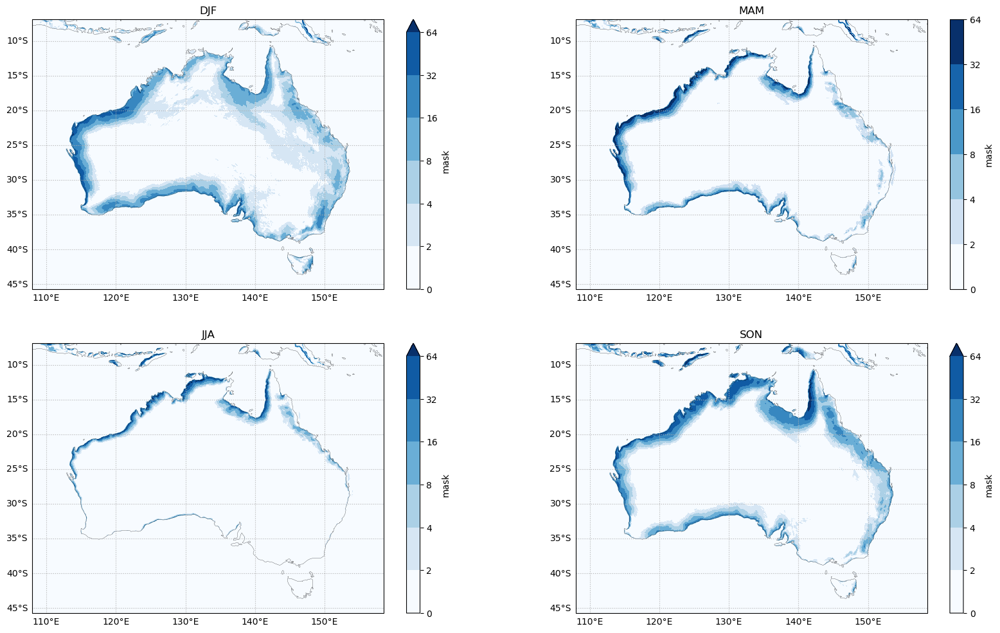

In [10]:
#levels = [0,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6]
levels = [0,2,4,8,16,32,64]

plt.figure(figsize=[20,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
mean_djf_aest.plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("DJF")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
mean_mam_aest.plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("MAM")

ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
mean_jja_aest.plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("JJA")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
mean_son_aest.plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("SON")

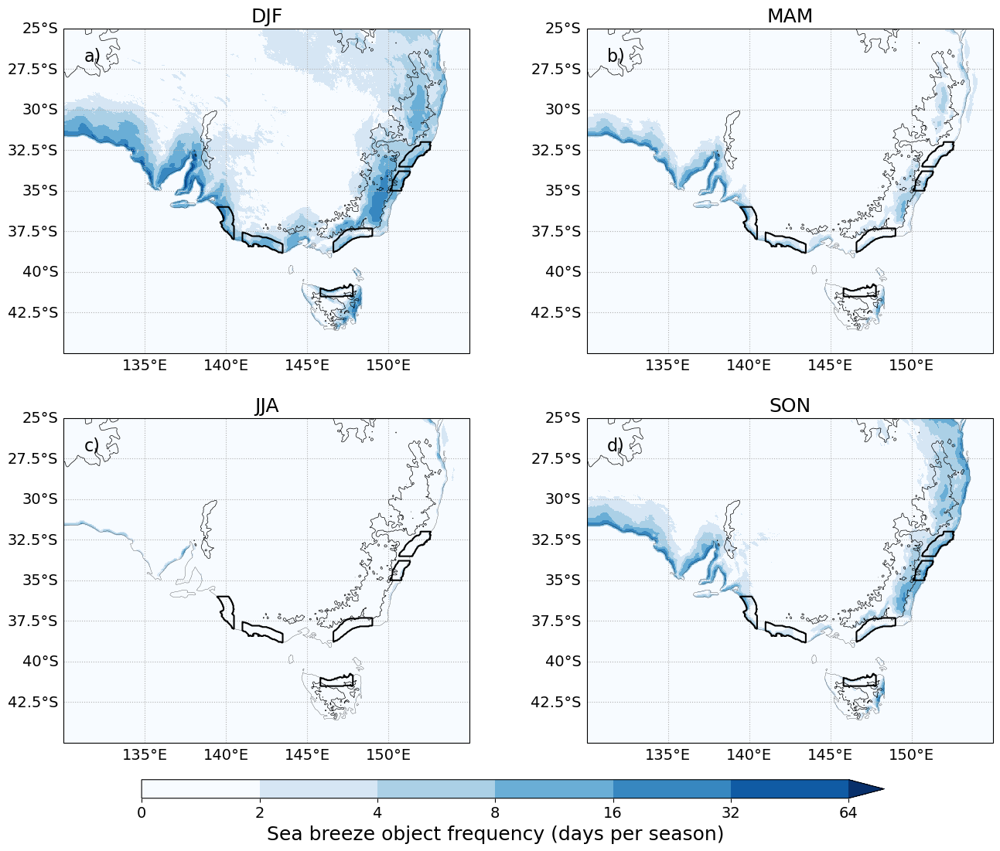

In [12]:
levels = [0,2,4,8,16,32,64]

lat_slice = slice(-45,-25)
lon_slice = slice(130,155)

plt.figure(figsize=[16,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
mean_djf_aest.sel(lat=lat_slice,lon=lon_slice).plot(cmap="Blues",levels=levels,add_colorbar=False,extend="max")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"],xlabel_style={"size":14},ylabel_style={"size":14})
xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0).sel(lat=lat_slice,lon=lon_slice),
    levels=1,colors=["k"])
orog.sel(lat=lat_slice,lon=lon_slice).orog.plot.contour(levels=[500],colors=["k"],linewidths=0.5)
plt.title("DJF",size=18)
ax.text(0.05,0.9,"a)",transform=ax.transAxes,fontdict={"size":"16"})

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
mean_mam_aest.sel(lat=lat_slice,lon=lon_slice).plot(cmap="Blues",levels=levels,add_colorbar=False,extend="max")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"],xlabel_style={"size":14},ylabel_style={"size":14})
xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0).sel(lat=lat_slice,lon=lon_slice),
    levels=1,colors=["k"])
orog.sel(lat=lat_slice,lon=lon_slice).orog.plot.contour(levels=[500],colors=["k"],linewidths=0.5)
plt.title("MAM",size=18)
ax.text(0.05,0.9,"b)",transform=ax.transAxes,fontdict={"size":"16"})

ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
mean_jja_aest.sel(lat=lat_slice,lon=lon_slice).plot(cmap="Blues",levels=levels,add_colorbar=False,extend="max")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"],xlabel_style={"size":14},ylabel_style={"size":14})
xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0).sel(lat=lat_slice,lon=lon_slice),
    levels=1,colors=["k"])
orog.sel(lat=lat_slice,lon=lon_slice).orog.plot.contour(levels=[500],colors=["k"],linewidths=0.5)
plt.title("JJA",size=18)
ax.text(0.05,0.9,"c)",transform=ax.transAxes,fontdict={"size":"16"})

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
c=mean_son_aest.sel(lat=lat_slice,lon=lon_slice).plot(cmap="Blues",levels=levels,add_colorbar=False,extend="max")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"],xlabel_style={"size":14},ylabel_style={"size":14})
xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0).sel(lat=lat_slice,lon=lon_slice),
    levels=1,colors=["k"])
orog.sel(lat=lat_slice,lon=lon_slice).orog.plot.contour(levels=[500],colors=["k"],linewidths=0.5)
plt.title("SON",size=18)
ax.text(0.05,0.9,"d)",transform=ax.transAxes,fontdict={"size":"16"})

cb=plt.colorbar(c,cax=plt.axes([0.2,0.05,0.6,0.02]),orientation="horizontal")
cb.ax.set_xticklabels(levels,fontdict={"size":14})
cb.set_label("Sea breeze object frequency (days per season)",size=18)

plt.savefig("/g/data/ng72/ab4502/figs/wind_energy_paper/sb_map_seaus.jpeg",bbox_inches="tight",dpi=300)

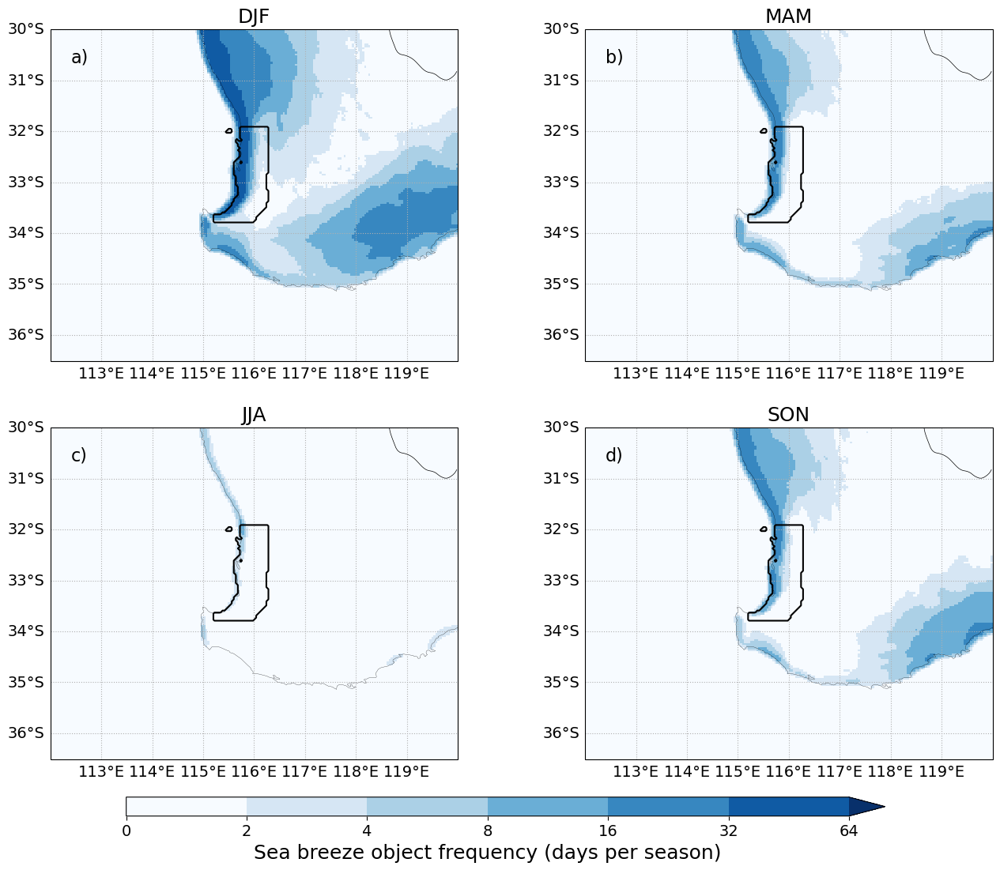

In [13]:
levels = [0,2,4,8,16,32,64]

lat_slice = slice(-36.5,-30)
lon_slice = slice(112,120)

plt.figure(figsize=[16,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
mean_djf_awst.sel(lat=lat_slice,lon=lon_slice).plot(cmap="Blues",levels=levels,add_colorbar=False,extend="max")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"],xlabel_style={"size":14},ylabel_style={"size":14})
xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0).sel(lat=lat_slice,lon=lon_slice),
    levels=1,colors=["k"])
orog.sel(lat=lat_slice,lon=lon_slice).orog.plot.contour(levels=[500],colors=["k"],linewidths=0.5)
plt.title("DJF",size=18)
ax.text(0.05,0.9,"a)",transform=ax.transAxes,fontdict={"size":"16"})

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
mean_mam_awst.sel(lat=lat_slice,lon=lon_slice).plot(cmap="Blues",levels=levels,add_colorbar=False,extend="max")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"],xlabel_style={"size":14},ylabel_style={"size":14})
xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0).sel(lat=lat_slice,lon=lon_slice),
    levels=1,colors=["k"])
orog.sel(lat=lat_slice,lon=lon_slice).orog.plot.contour(levels=[500],colors=["k"],linewidths=0.5)
plt.title("MAM",size=18)
ax.text(0.05,0.9,"b)",transform=ax.transAxes,fontdict={"size":"16"})

ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
mean_jja_awst.sel(lat=lat_slice,lon=lon_slice).plot(cmap="Blues",levels=levels,add_colorbar=False,extend="max")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"],xlabel_style={"size":14},ylabel_style={"size":14})
xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0).sel(lat=lat_slice,lon=lon_slice),
    levels=1,colors=["k"])
orog.sel(lat=lat_slice,lon=lon_slice).orog.plot.contour(levels=[500],colors=["k"],linewidths=0.5)
plt.title("JJA",size=18)
ax.text(0.05,0.9,"c)",transform=ax.transAxes,fontdict={"size":"16"})

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
c=mean_son_awst.sel(lat=lat_slice,lon=lon_slice).plot(cmap="Blues",levels=levels,add_colorbar=False,extend="max")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"],xlabel_style={"size":14},ylabel_style={"size":14})
xr.plot.contour(
    xr.where(shapes["lsm"],
            (shapes["gipps_landsea"] +\
            shapes["newcastle_landsea"] +\
            shapes["illawara_landsea"] +\
            shapes["southern_landsea"] +\
            shapes["sa_landsea"] +\
            shapes["tas_landsea"] +\
            shapes["bunbury_landsea"]),
        0).sel(lat=lat_slice,lon=lon_slice),
    levels=1,colors=["k"])
orog.sel(lat=lat_slice,lon=lon_slice).orog.plot.contour(levels=[500],colors=["k"],linewidths=0.5)
plt.title("SON",size=18)
ax.text(0.05,0.9,"d)",transform=ax.transAxes,fontdict={"size":"16"})

cb=plt.colorbar(c,cax=plt.axes([0.2,0.05,0.6,0.02]),orientation="horizontal")
cb.ax.set_xticklabels(levels,fontdict={"size":14})
cb.set_label("Sea breeze object frequency (days per season)",size=18)
plt.savefig("/g/data/ng72/ab4502/figs/wind_energy_paper/sb_map_wa.jpeg",bbox_inches="tight",dpi=300)

In [10]:
u = xr.open_mfdataset("/g/data/ob53/BARRA2/output/reanalysis/AUST-04/BOM/ERA5/historical/hres/BARRA-C2/v1/mon/ua850/latest/ua850_AUST-04_ERA5_historical_hres_BOM_BARRA-C2_v1_mon_*",chunks={})
v = xr.open_mfdataset("/g/data/ob53/BARRA2/output/reanalysis/AUST-04/BOM/ERA5/historical/hres/BARRA-C2/v1/mon/va850/latest/va850_AUST-04_ERA5_historical_hres_BOM_BARRA-C2_v1_mon_*",chunks={})

In [13]:
umean = u.ua850.mean("time").persist()
vmean = v.va850.mean("time").persist()

In [17]:
umean_season = u.ua850.groupby("time.season").mean().persist()
vmean_season = v.va850.groupby("time.season").mean().persist()

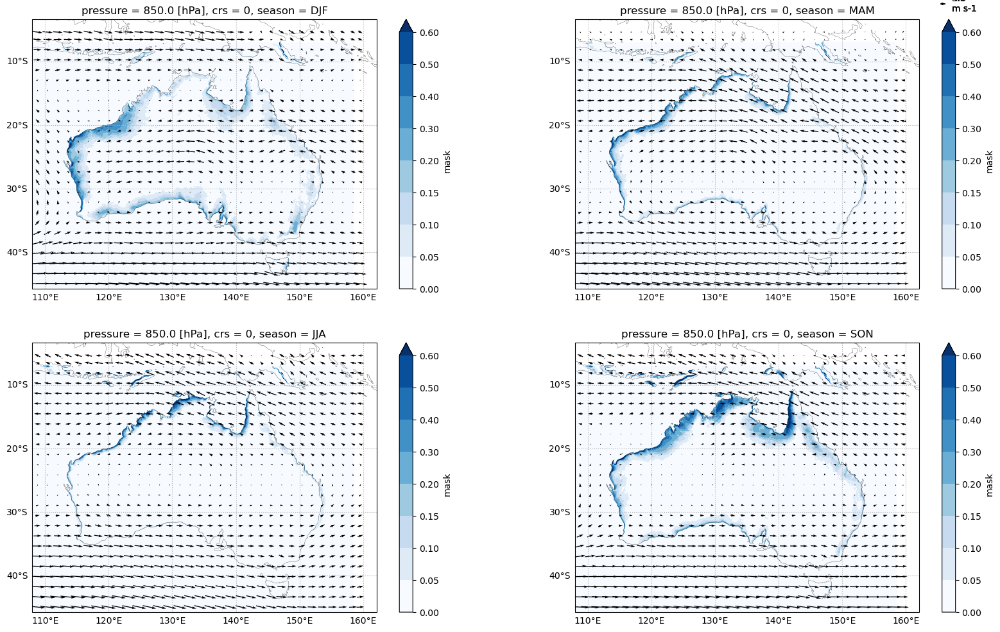

In [22]:
levels = [0,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6]

c=40

plt.figure(figsize=[20,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("DJF")

xr.Dataset({"u":umean_season.sel(season="DJF"),"v":vmean_season.sel(season="DJF")}).coarsen({"lat":c,"lon":c},boundary="pad").mean().\
    plot.quiver(x="lon",y="lat",u="u",v="v")


ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[3,4,5])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("MAM")
xr.Dataset({"u":umean_season.sel(season="MAM"),"v":vmean_season.sel(season="MAM")}).coarsen({"lat":c,"lon":c},boundary="pad").mean().\
    plot.quiver(x="lon",y="lat",u="u",v="v")

ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[6,7,8])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("JJA")
xr.Dataset({"u":umean_season.sel(season="JJA"),"v":vmean_season.sel(season="JJA")}).coarsen({"lat":c,"lon":c},boundary="pad").mean().\
    plot.quiver(x="lon",y="lat",u="u",v="v")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[9,10,11])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("SON")
xr.Dataset({"u":umean_season.sel(season="SON"),"v":vmean_season.sel(season="SON")}).coarsen({"lat":c,"lon":c},boundary="pad").mean().\
    plot.quiver(x="lon",y="lat",u="u",v="v")

In [23]:
tasmax = xr.open_mfdataset("/g/data/ob53/BARRA2/output/reanalysis/AUST-04/BOM/ERA5/historical/hres/BARRA-C2/v1/mon/tasmax/latest/tasmax_AUST-04_ERA5_historical_hres_BOM_BARRA-C2_v1_mon_*",chunks={})

In [25]:
tasmax_mean_season = tasmax.tasmax.groupby("time.season").mean().persist()

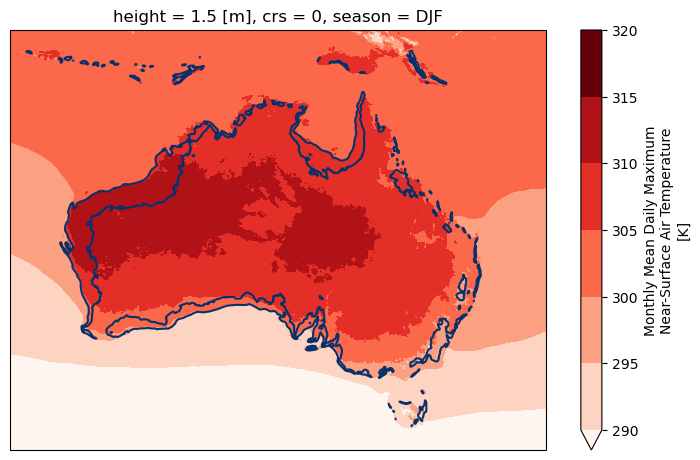

In [44]:
levels = [0.1]

plt.figure(figsize=[20,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
xr.plot.contour(fdaily.sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time"),levels=levels,cmap="Blues")
xr.plot.contourf(tasmax_mean_season.sel(season="DJF"),levels=[290,295,300,305,310,315,320],cmap="Reds")


# ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
# xr.plot.contour(fdaily.sel(time=np.in1d(fdaily.time.dt.month,[9,10,11])).mean("time"),levels=levels,cmap="Blues")
# xr.plot.contourf(tasmax_mean_season.sel(season="SON"),levels=[290,295,300,305,310,315,320],cmap="Reds")

In [ ]:
levels = [0,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6]

lat_slice=slice(-45,-30)
lon_slice=slice(135,155)

plt.figure(figsize=[20,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
xr.plot.contour(
    orog.orog.sel(lat=lat_slice,lon=lon_slice),
    levels=[500],
    colors=["k"],
    linewidths=0.2,
    add_colorbar=False)  
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("DJF")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[3,4,5])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
xr.plot.contour(
    orog.orog.sel(lat=lat_slice,lon=lon_slice),
    levels=[500],
    colors=["k"],
    linewidths=0.2,
    add_colorbar=False)  
plt.title("MAM")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[6,7,8])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
xr.plot.contour(
    orog.orog.sel(lat=lat_slice,lon=lon_slice),
    levels=[500],
    colors=["k"],
    linewidths=0.2,
    add_colorbar=False)  
plt.title("JJA")


ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[9,10,11])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
xr.plot.contour(
    orog.orog.sel(lat=lat_slice,lon=lon_slice),
    levels=[500],
    colors=["k"],
    linewidths=0.2,
    add_colorbar=False)  
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("SON")

In [8]:
p2 = fdaily.sel(time=(fdaily.time.dt.year >= 2002) & (fdaily.time.dt.year <= 2024))
p1 = fdaily.sel(time=(fdaily.time.dt.year >= 1979) & (fdaily.time.dt.year <= 2001))

p2 = (p2.sum("time") / (p2.time.shape[0] / 365)).persist()
p1 = (p1.sum("time") / (p1.time.shape[0] / 365)).persist()

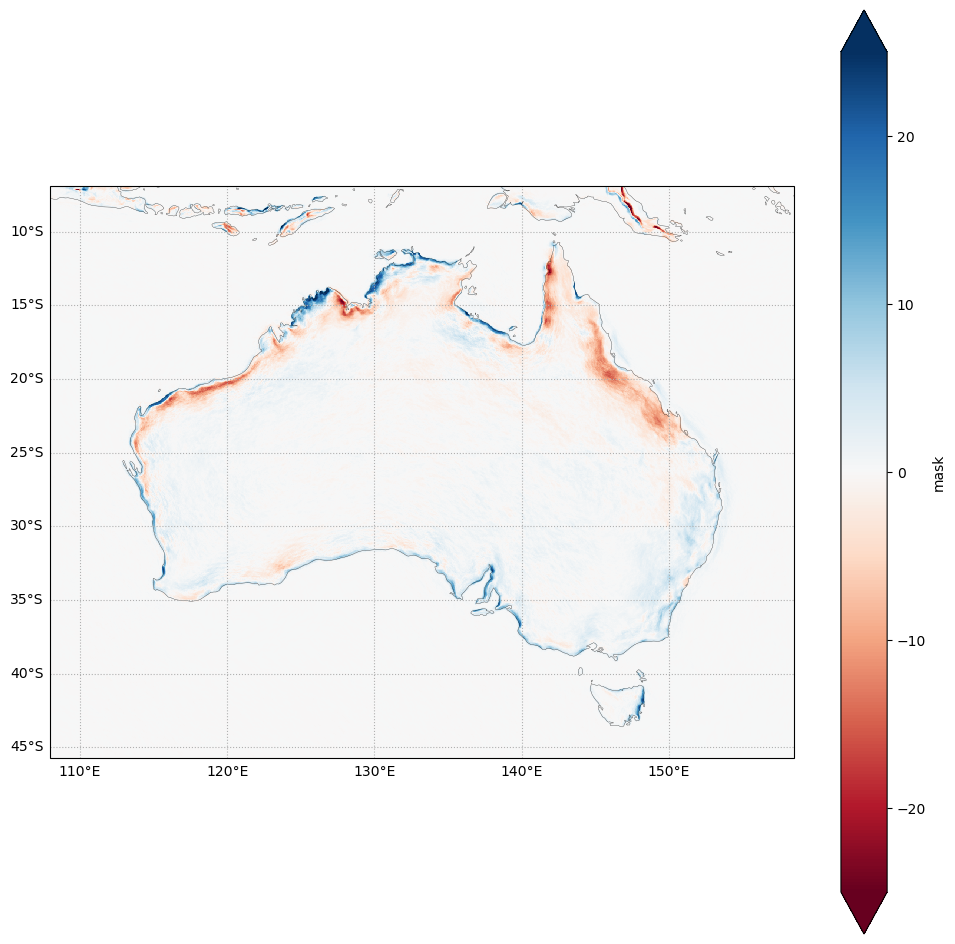

In [10]:
plt.figure(figsize=[12,12])
ax=plt.axes(projection=ccrs.PlateCarree())
(p2-p1).plot(ax=ax,cmap="RdBu",vmin=-25,vmax=25)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])

In [60]:
import hvplot.xarray

In [61]:
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time").hvplot(height=600,cmap="Blues")

:Image   [lon,lat]   (mask)

In [66]:
(p2-p1).hvplot(height=600,cmap="RdBu")

:Image   [lon,lat]   (mask)